# Co-occurrence Network

## 資料處理

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

In [3]:
df = pd.read_csv('0410-0416_user_history.csv')

In [466]:
df.head()

,timestamp,category,action,symbolId,cardName,user_id
0,2020-04-09 16:00:09.008,card,open,2414,股價K線,1970
1,2020-04-09 16:00:09.018,card,open,2414,基本概況,1970
2,2020-04-09 16:00:09.027,card,open,2414,即時走勢,1970
3,2020-04-09 16:00:09.036,card,open,2414,基本資料,1970
4,2020-04-09 16:00:09.045,card,open,2414,新聞,1970


In [5]:
u_id = df['user_id'].unique()
u_id.sort()

In [6]:
all_sym = df['symbolId'].unique() #所有被瀏覽過的股票代碼

In [7]:
sym_list = [] #每個用戶查過的股票代碼
for i in u_id:
    data = df[df['user_id'] == i]
    sym = data['symbolId'].unique()
    if len(sym)>=2:
        sym_list.append(sym)

In [8]:
output=[]
for i in range(len(sym_list)):
    out=[]
    df1 = sym_list[i]
    for a in all_sym:
        if a in df1:
            out.append(1)
        else:
            out.append(0)
    output.append(out)

## Co-Occurrence Matrix

In [9]:
df_co = pd.DataFrame(output, columns = all_sym)

In [10]:
df_co.head()

,2414,1707,3596,3037,1732,6239,3711,00677U,6504,2345,...,00831B,2030,1591,OC,2856,CC,6174,00865B,4765,GOLD
0,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
# df_co.to_csv('df_co.csv')

In [17]:
df_co_t = df_co.transpose() #轉置矩陣
co_sym = df_co_t.dot(df_co) #矩陣相乘

In [380]:
co_sym.head()

,2414,1707,3596,3037,1732,6239,3711,00677U,6504,2345,...,00831B,2030,1591,OC,2856,CC,6174,00865B,4765,GOLD
2414,15,0,1,3,0,1,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
1707,0,28,1,4,2,4,1,6,5,1,...,0,0,0,0,0,0,0,0,0,0
3596,1,1,49,13,2,7,6,9,3,17,...,0,0,0,0,0,0,0,0,1,0
3037,3,4,13,218,16,14,18,59,5,40,...,0,0,0,0,1,1,0,0,1,0
1732,0,2,2,16,65,2,1,23,16,6,...,0,0,0,0,0,0,0,0,0,0


### 統計各股出現的次數

In [19]:
freq = np.diagonal(co_sym)
freq = pd.DataFrame(freq,index=all_sym,columns=['freq'])
# freq.to_csv('freq.csv')

### 刪除出現次數為0的股票

In [20]:
notexist = freq[freq['freq']==0] #沒有被同時觀看的股票，意即客戶只有看此檔股票沒有看其他檔

In [21]:
notexist

,freq
2245,0
SPLG,0
4764,0
3462,0
3662,0
3285,0


In [28]:
freq = freq.drop(index=notexist.index) #刪除出現次數為0的股票

In [26]:
co_sym = co_sym.drop(index=notexist.index)
co_sym = co_sym.drop(notexist.index,axis=1)

### 股票共現的機率

In [31]:
row_conditional_probability = np.divide(co_sym, freq) #看橫排，(i,j)，已知在i出現的機率下，j也會出現的機率 

In [33]:
row_conditional_probability.head()

,2414,1707,3596,3037,1732,6239,3711,00677U,6504,2345,...,00831B,2030,1591,OC,2856,CC,6174,00865B,4765,GOLD
2414,1.000000,0.000000,0.066667,0.200000,0.000000,0.066667,0.000000,0.066667,0.000000,0.066667,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0
1707,0.000000,1.000000,0.035714,0.142857,0.071429,0.142857,0.035714,0.214286,0.178571,0.035714,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0
3596,0.020408,0.020408,1.000000,0.265306,0.040816,0.142857,0.122449,0.183673,0.061224,0.346939,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.020408,0.0
3037,0.013761,0.018349,0.059633,1.000000,0.073394,0.064220,0.082569,0.270642,0.022936,0.183486,...,0.0,0.0,0.0,0.0,0.004587,0.004587,0.0,0.0,0.004587,0.0
1732,0.000000,0.030769,0.030769,0.246154,1.000000,0.030769,0.015385,0.353846,0.246154,0.092308,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0


## 所有股票熱點圖

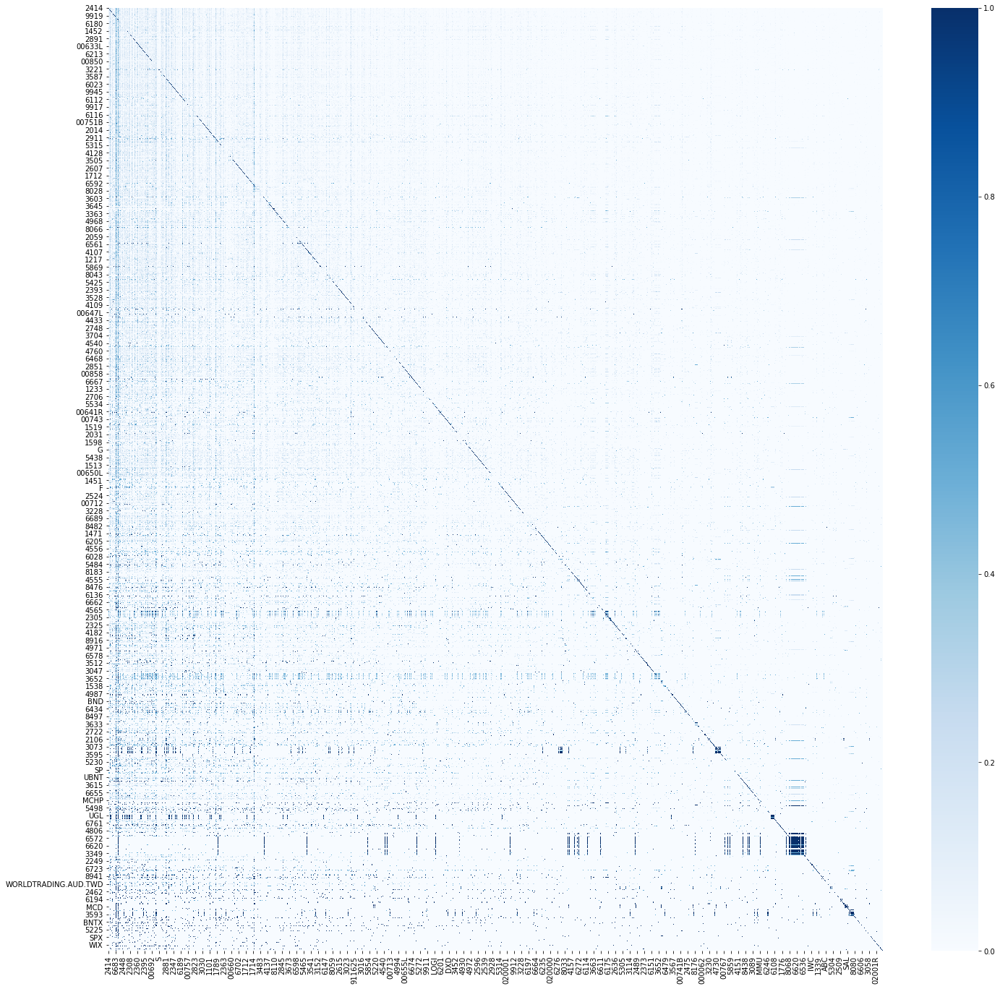

In [447]:
plt.figure(figsize=(24,24))
sns.heatmap(row_conditional_probability,cmap='Blues')
plt.savefig('co_sym.png')
plt.show()

<br>

## 所有股票共現圖

In [95]:
co_edge = []

In [96]:
# node大小用出現次數，path距離用機率
for i in row_conditional_probability.index:
    row = row_conditional_probability.loc[i]
    for j in row_conditional_probability.index:
        if i == j:
            continue
        else:
            if row[j] != 0:
                co_edge.append((i,j,row[j]*0.01))

In [382]:
co_edge

[('2414', '3596', 6.666666666666667e-05),
 ('2414', '3037', 0.0002),
 ('2414', '6239', 6.666666666666667e-05),
 ('2414', '00677U', 6.666666666666667e-05),
 ('2414', '2345', 6.666666666666667e-05),
 ('2414', '4938', 0.00013333333333333334),
 ('2414', '8040', 6.666666666666667e-05),
 ('2414', '3034', 6.666666666666667e-05),
 ('2414', '2880', 0.0002666666666666667),
 ('2414', '1464', 0.00013333333333333334),
 ('2414', '2884', 0.0004),
 ('2414', '9919', 6.666666666666667e-05),
 ('2414', '3003', 6.666666666666667e-05),
 ('2414', '6683', 6.666666666666667e-05),
 ('2414', '2330', 0.0003333333333333333),
 ('2414', '3702', 0.0002),
 ('2414', '006208', 0.00013333333333333334),
 ('2414', '2337', 0.00013333333333333334),
 ('2414', '6230', 6.666666666666667e-05),
 ('2414', '8155', 0.00013333333333333334),
 ('2414', 'TWSE_SEM_INDEX_1', 0.00046666666666666666),
 ('2414', '2892', 0.0003333333333333333),
 ('2414', '00672L', 6.666666666666667e-05),
 ('2414', '2201', 6.666666666666667e-05),
 ('2414', '17

In [99]:
G = nx.Graph()
G.add_nodes_from(freq.index)
G.add_weighted_edges_from(co_edge) #新增有權重的邊

/Users/jiaying/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


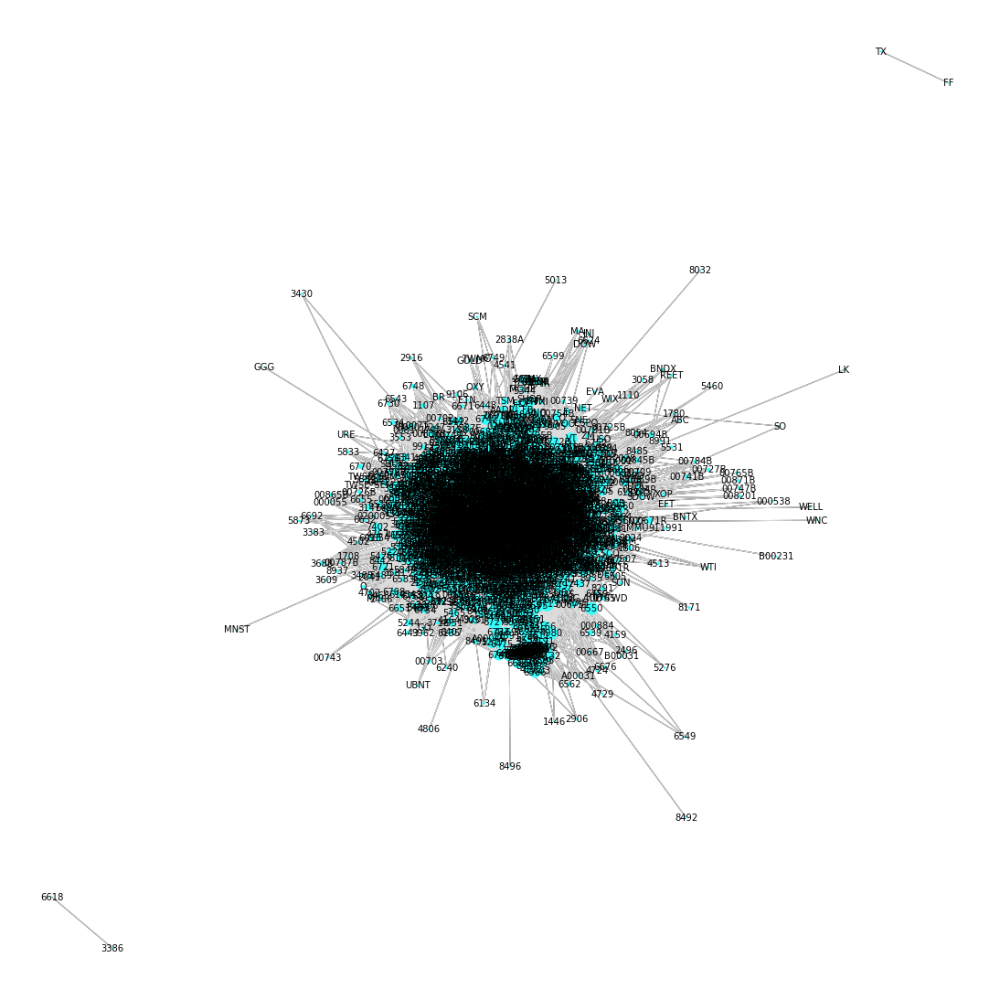

In [102]:
plt.figure(figsize=(15,15))
plt.rcParams['font.sans-serif'] = ['SimHei']   
plt.rcParams['font.family']='sans-serif'
pos=nx.spring_layout(G)
nx.draw(G,pos,node_size=[val for (node, val) in G.degree()],font_family='sans-serif',node_color='#33FFFF')
nx.draw_networkx_labels(G, pos, font_size =10 , font_family='sans-serif',alpha=1)
nx.draw_networkx_edges(G, pos, edge_color='#DDDDDD', alpha=1)
# plt.savefig('Co-occurrence map.png')
plt.show()

刪除離群的股票，再畫一次 ⬇️

In [110]:
row_conditional_probability = row_conditional_probability.drop(index=['6618','3386','TX','FF'],columns=['6618','3386','TX','FF'])

In [115]:
co_edge=[]

In [116]:
# node大小用出現次數，path距離用機率
for i in row_conditional_probability.index:
    row = row_conditional_probability.loc[i]
    for j in row_conditional_probability.index:
        if i == j:
            continue
        else:
            if row[j] != 0:
                co_edge.append((i,j,row[j]*0.001))

In [119]:
g = nx.Graph()
g.add_weighted_edges_from(co_edge) #新增有權重的邊

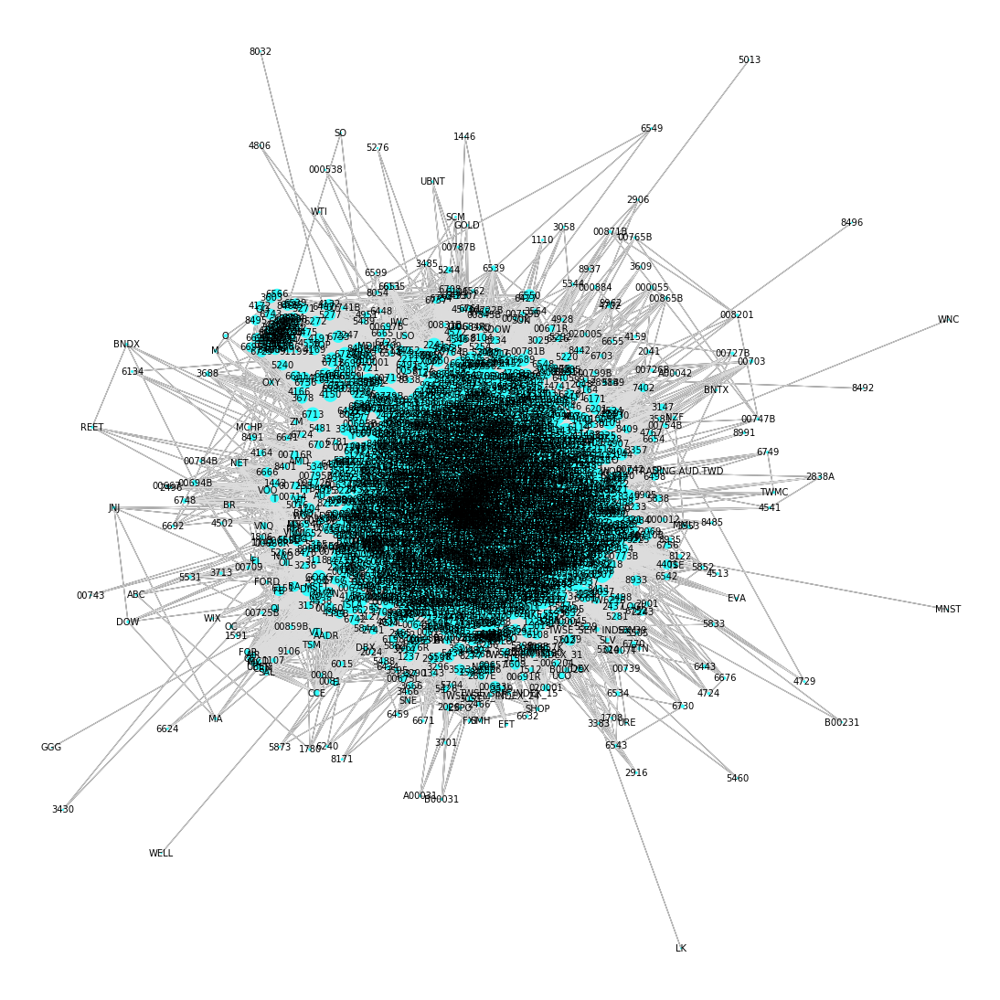

In [120]:
plt.figure(figsize=(15,15))
plt.rcParams['font.sans-serif'] = ['SimHei']   
plt.rcParams['font.family']='sans-serif'
pos=nx.spring_layout(g)
nx.draw(g,pos,node_size=[val for (node, val) in g.degree()],font_family='sans-serif',node_color='#33FFFF')
nx.draw_networkx_labels(g, pos, font_size =10 , font_family='sans-serif',alpha=1)
nx.draw_networkx_edges(g, pos, edge_color='#DDDDDD', alpha=1)
# plt.savefig('Co-occurrence map.png')
plt.show()

由於資料過多，所以看不出什麼資訊，因此統計各股被瀏覽次數。

### 找出最多人觀看的股票

In [41]:
freq_top10 = freq.sort_values(by='freq')

In [43]:
freq_top10

,freq
GOLD,1
AXP,1
NXPI,1
AVGO,1
QCOM,1
3595,1
000877,1
MSI,1
6671,1
1742,1


In [45]:
pf = freq_top10[-10:]

In [46]:
pf.index

Index(['00642U', '2886', '2303', '2337', '2317', '0056', '0050',
       'TWSE_SEM_INDEX_1', '2884', '2330'],
      dtype='object')

In [47]:
pf['freq'].values

array([ 390,  431,  431,  452,  493,  663,  819,  839,  880, 1275])

<BarContainer object of 10 artists>

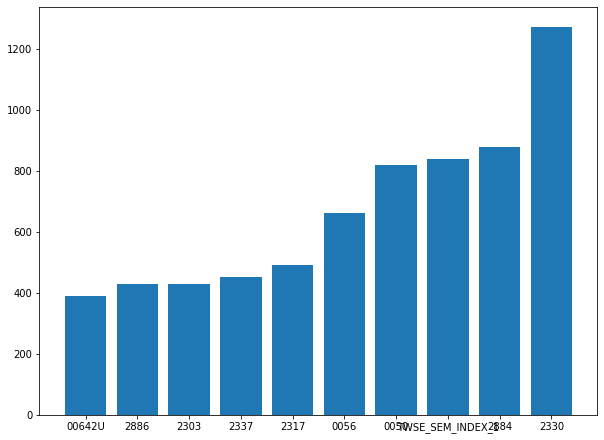

In [48]:
plt.figure(figsize=(10,7.5))
plt.bar(pf.index,pf['freq'].values)

得出2330為此週最多人觀看的股票，因此選取2330為發散中心

## 瀏覽2330台積電的人也會瀏覽

In [49]:
co_edge_2330 = []

In [50]:
row_conditional_probability.head()

,2414,1707,3596,3037,1732,6239,3711,00677U,6504,2345,...,00831B,2030,1591,OC,2856,CC,6174,00865B,4765,GOLD
2414,1.000000,0.000000,0.066667,0.200000,0.000000,0.066667,0.000000,0.066667,0.000000,0.066667,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0
1707,0.000000,1.000000,0.035714,0.142857,0.071429,0.142857,0.035714,0.214286,0.178571,0.035714,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0
3596,0.020408,0.020408,1.000000,0.265306,0.040816,0.142857,0.122449,0.183673,0.061224,0.346939,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.020408,0.0
3037,0.013761,0.018349,0.059633,1.000000,0.073394,0.064220,0.082569,0.270642,0.022936,0.183486,...,0.0,0.0,0.0,0.0,0.004587,0.004587,0.0,0.0,0.004587,0.0
1732,0.000000,0.030769,0.030769,0.246154,1.000000,0.030769,0.015385,0.353846,0.246154,0.092308,...,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [53]:
row = row_conditional_probability.loc['2330']
for j in row_conditional_probability.index:
    if row[j] != 0:
        co_edge_2330.append(('2330',j,row[j]*100))

### 2330_共現圖

In [54]:
C = nx.Graph()

In [55]:
C.add_weighted_edges_from(co_edge_2330)#新增有權重的
# C.add_nodes_from() #新增節點

/Users/jiaying/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


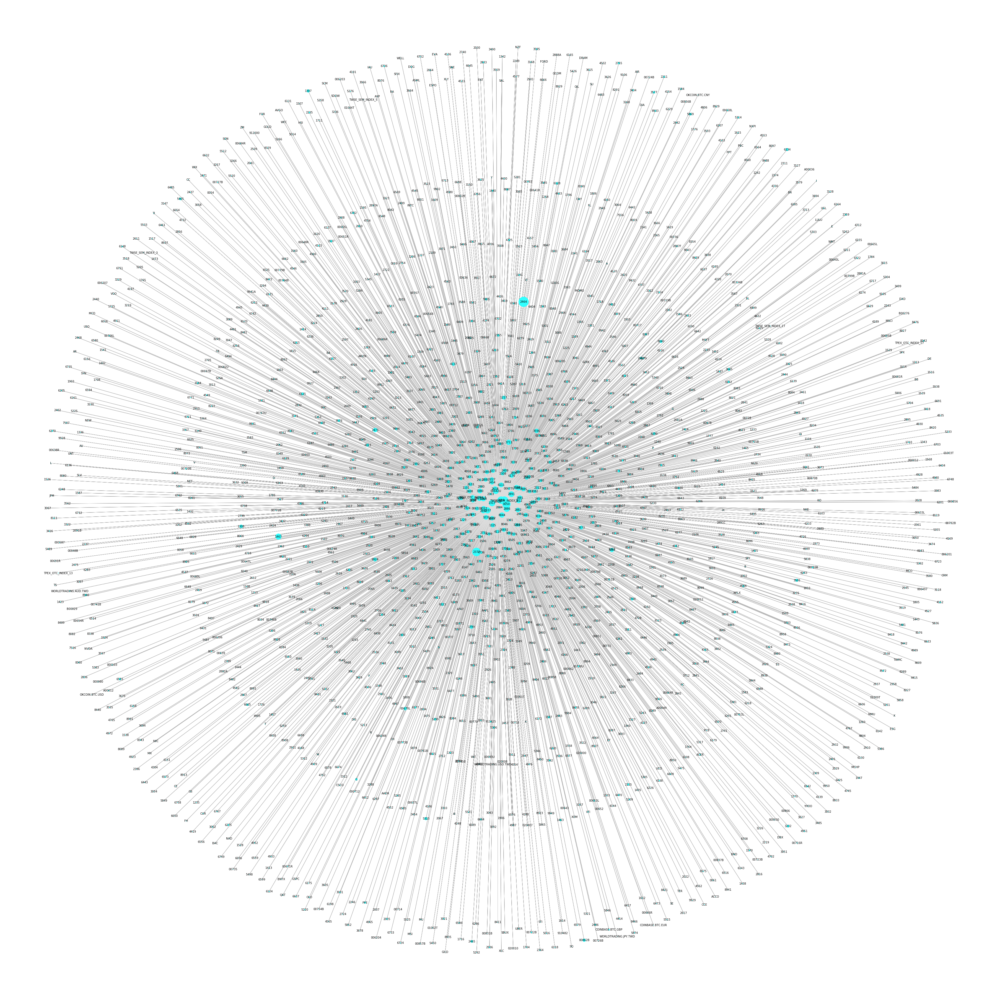

In [58]:
plt.figure(figsize=(50,50))
plt.rcParams['font.sans-serif'] = ['SimHei']   
plt.rcParams['font.family']='sans-serif'
pos=nx.spring_layout(C)
nx.draw(C,pos,node_size=freq,font_family='sans-serif',node_color='#33FFFF')
nx.draw_networkx_labels(C, pos, font_size = 10, font_family='sans-serif',alpha=1)
nx.draw_networkx_edges(C, pos, edge_color='#DDDDDD', alpha=1)
# plt.savefig('2330_Co-occurrence map.png')
plt.show()

edge長度為此股票在已知瀏覽2330的情況下與2330的共現頻率，越遠代表共現率越低\
node size 越大代表此股越多人瀏覽過，越小代表越少人瀏覽過（瀏覽次數為此週總計人次，非在已知瀏覽2330的情況下之瀏覽次數）

<br>

資料過複雜，取出與2330台積電共現頻率較高的幾檔股票再畫一次。⬇️

In [161]:
def co_map_edge(symbolId):
    co_edge_symbolId = []
    weight=[]
    row = row_conditional_probability.loc['%d'%symbolId]
    for j in row_conditional_probability.index:
        if row[j]==1:
            weight.insert(0,1)
        else:
            if row[j] >= 0.1:
                co_edge_symbolId.append(('%d'%symbolId,j,row[j]*1000))
                weight.append(row[j])
    return co_edge_symbolId,weight

In [52]:
def graph_one(C,symbolId,freq):
    plt.figure(figsize=(50,50))
    plt.rcParams['font.sans-serif'] = ['SimHei']   
    plt.rcParams['font.family']='sans-serif'
    pos=nx.spring_layout(C)
    nx.draw(C,pos,node_size=freq.values,font_family='sans-serif',node_color='#33FFFF')
    nx.draw_networkx_labels(C, pos, font_size = 10, font_family='sans-serif',alpha=1)
    nx.draw_networkx_edges(C, pos, edge_color='#DDDDDD', alpha=1)
    plt.savefig('%d'%symbolId+'_Co-occurrence map.png')
    plt.show()

In [162]:
edge_2330,weight_2330 = co_map_edge(2330)

In [211]:
freq_2330=[freq.loc['2330']['freq']]
for i in edge_2330:
    freq_2330.append(freq.loc[i[1]]['freq'])

In [216]:
C = nx.Graph()
C.add_weighted_edges_from(edge_2330)
# C.add_edges_from(edge_2330)

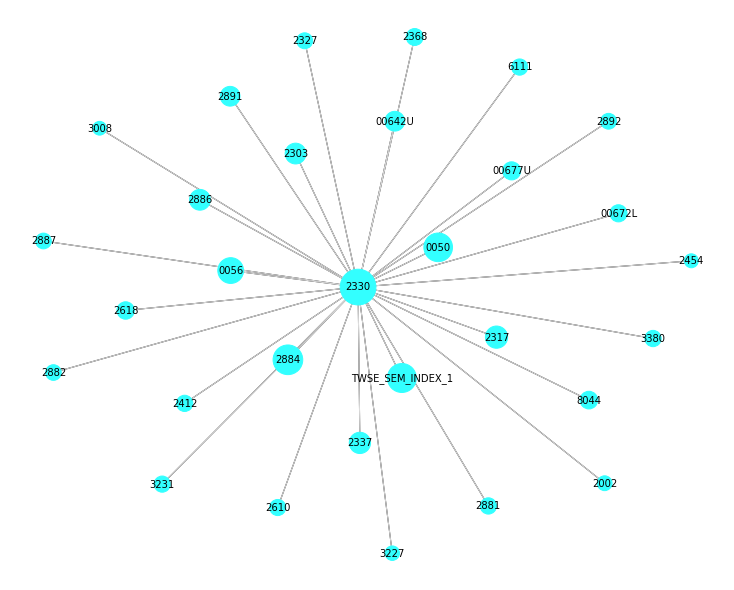

In [375]:
plt.figure(figsize=(10,8))
plt.rcParams['font.sans-serif'] = ['SimHei']   
plt.rcParams['font.family']='sans-serif'
pos=nx.spring_layout(C)
nx.draw(C,pos,node_size=freq_2330,font_family='sans-serif',node_color='#33FFFF')
nx.draw_networkx_labels(C, pos, font_size = 10, font_family='sans-serif',alpha=1)
nx.draw_networkx_edges(C, pos, edge_color='#DDDDDD', alpha=1)
# plt.savefig('2330_Co_map.png')
plt.show()

距離為共現機率，節點大小為被瀏覽的總人次。<br>
從圖中可得知，看2330台積電的人也會看0050、0056、2884、2317、2337等等股票，<br>
其中0050、0056為ETF，而2884玉山金為Fugle合作夥伴，因此玉山金的瀏覽次數與共現頻率可能不是那麼準確。

<br>

## 抓取與2330共現的股票特徵
沒有ETF的部分，因為ETF沒有本益比。指標選擇根據專題小組共同決定而來。

In [223]:
list2330 = sorted(edge_2330,key=lambda s:s[2],reverse=True)

In [270]:
df1 = pd.read_csv('0416_to.csv')

In [271]:
df1

,股票代碼,中文簡稱,0416股價,當日漲跌幅,殖利率(%),股利年度,本益比,股價淨值比,Beta
0,2330,台積電,286.50,-0.35%,3.32,108,21.51,4.58,1.2420
1,2884,玉山金,26.40,-0.94%,6.02,108,15.26,1.70,1.0389
2,2317,鴻海,74.00,-0.13%,5.41,107,8.89,0.83,1.0823
3,2337,旺宏,31.75,0.79%,3.78,108,19.36,1.80,1.5892
4,2886,兆豐金,28.80,-1.37%,5.90,107,13.52,1.21,0.6424
5,2303,聯電,14.90,-1.32%,5.03,108,17.95,0.84,0.6602
6,2891,中信金,19.50,-2.01%,5.13,107,9.11,1.02,0.8707
7,2412,中華電,108.00,-0.92%,3.92,108,25.53,2.23,0.1994
8,2618,長榮航,10.40,-2.35%,2.40,108,12.68,0.71,1.0082
9,2327,國巨,341.50,-0.58%,4.39,108,21.02,3.16,1.6990


In [240]:
col_2330 = ['股價0~50','股價50~100','股價100~200','股價>200','殖利率1~5','殖利率>5','本益比<12',
       '本益比12~20','本益比>20','股價淨值比<1','股價淨值比>1','Beta<1','Beta>1']

In [296]:
df0416_2330_to = pd.DataFrame(index = df1['股票代碼'].values,columns = col_2330)

In [281]:
df1.iloc[0]

股票代碼        2330
中文簡稱         台積電
0416股價     286.5
當日漲跌幅     -0.35%
殖利率(%)      3.32
股利年度         108
本益比        21.51
股價淨值比       4.58
Beta       1.242
Name: 0, dtype: object

### 建立共現矩陣

In [297]:
for i in range(len(df1)):
    a = df1.iloc[i]
    b = df0416_2330_to.iloc[i]
    if a[2]: #股價
        if a[2]<=50:
            b[0] = 1
        elif 50<a[2]<=100:
            b[1] = 1
        elif 100<a[2]<=200:
            b[2] = 1
        else:
            b[3] = 1
    if a[4]: #殖利率
        if 1<a[4]<=5:
            b[4] = 1
        elif a[4]>5:
            b[5] = 1
    if a[6]: #本益比
        if a[6]<=12:
            b[6] = 1
        elif 12<a[6]<=20:
            b[7]=1
        elif a[6]>20:
            b[8] =1
    if a[7]: #股價淨值比
        if a[7]<=1:
            b[9] = 1
        else:
            b[10] = 1
    if a[8]: #beta
        if a[8]<=1:
            b[11] = 1
        else:
            b[12] =1
        

In [298]:
df0416_2330_to = df0416_2330_to.fillna(0)
df0416_2330_to

,股價0~50,股價50~100,股價100~200,股價>200,殖利率1~5,殖利率>5,本益比<12,本益比12~20,本益比>20,股價淨值比<1,股價淨值比>1,Beta<1,Beta>1
2330,0,0,0,1,1,0,0,0,1,0,1,0,1
2884,1,0,0,0,0,1,0,1,0,0,1,0,1
2317,0,1,0,0,0,1,1,0,0,1,0,0,1
2337,1,0,0,0,1,0,0,1,0,0,1,0,1
2886,1,0,0,0,0,1,0,1,0,0,1,1,0
2303,1,0,0,0,0,1,0,1,0,1,0,1,0
2891,1,0,0,0,0,1,1,0,0,0,1,1,0
2412,0,0,1,0,1,0,0,0,1,0,1,1,0
2618,1,0,0,0,1,0,0,1,0,1,0,0,1
2327,0,0,0,1,1,0,0,0,1,0,1,0,1


In [312]:
co_df0416_2330_to = pd.DataFrame(index=col_2330,columns = col_2330)
co_df0416_2330_to = co_df0416_2330_to.fillna(0)

In [317]:
for i in range(len(df0416_2330_to)):
    a = df0416_2330_to.iloc[i].values
    b = []
    for x in range(13):
        if a[x] == 1:
            b.append(x)
    for j in b:
        for k in b:
            if j != k:
                co_df0416_2330_to.iloc[j,k] += 1
                co_df0416_2330_to.iloc[k,j] += 1

In [318]:
co_df0416_2330_to

,股價0~50,股價50~100,股價100~200,股價>200,殖利率1~5,殖利率>5,本益比<12,本益比12~20,本益比>20,股價淨值比<1,股價淨值比>1,Beta<1,Beta>1
股價0~50,0,0,0,0,14,14,10,12,6,12,18,18,12
股價50~100,0,0,0,0,0,2,2,0,0,2,0,0,2
股價100~200,0,0,0,0,2,0,0,0,2,0,2,2,0
股價>200,0,0,0,0,8,0,0,2,6,0,8,0,8
殖利率1~5,14,0,2,8,0,0,4,6,12,8,16,10,14
殖利率>5,14,2,0,0,0,0,8,8,0,6,10,10,6
本益比<12,10,2,0,0,4,8,0,0,0,8,4,8,4
本益比12~20,12,0,0,2,6,8,0,0,0,4,10,6,8
本益比>20,6,0,2,6,12,0,0,0,0,0,14,4,10
股價淨值比<1,12,2,0,0,8,6,8,4,0,0,0,10,4


### 熱點圖

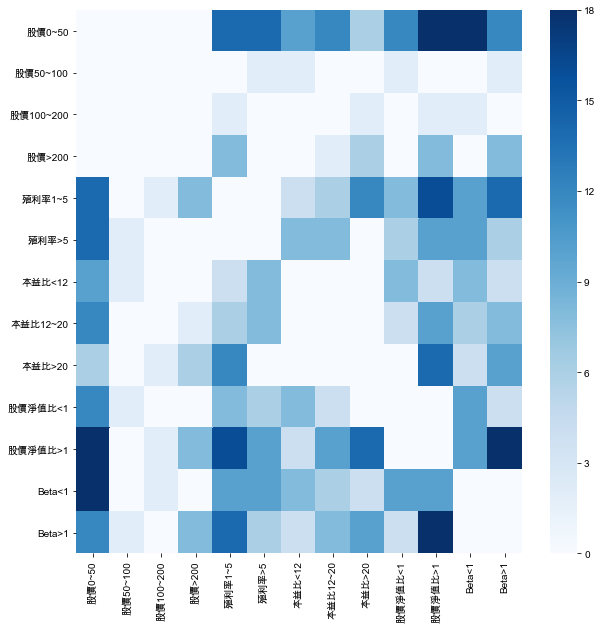

In [379]:
plt.figure(figsize=(10,10))
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']
sns.heatmap(co_df0416_2330_to,cmap='Blues')
# plt.savefig('0416_2330_co_sym.png')
plt.show()

### 共現圖

In [325]:
co_edge_df0416 = []
for i in col_2330:
    for j in col_2330:
        if co_df0416_2330_to.loc[i][j]>0:
            co_edge_df0416.append((i,j,co_df0416_2330_to.loc[i][j]))

In [326]:
A = nx.Graph()
A.add_weighted_edges_from(co_edge_df0416)

In [374]:
A.degree()

DegreeView({'股價0~50': 9, '殖利率1~5': 10, '殖利率>5': 8, '本益比<12': 8, '本益比12~20': 8, '本益比>20': 7, '股價淨值比<1': 8, '股價淨值比>1': 10, 'Beta<1': 9, 'Beta>1': 10, '股價50~100': 4, '股價100~200': 4, '股價>200': 5})

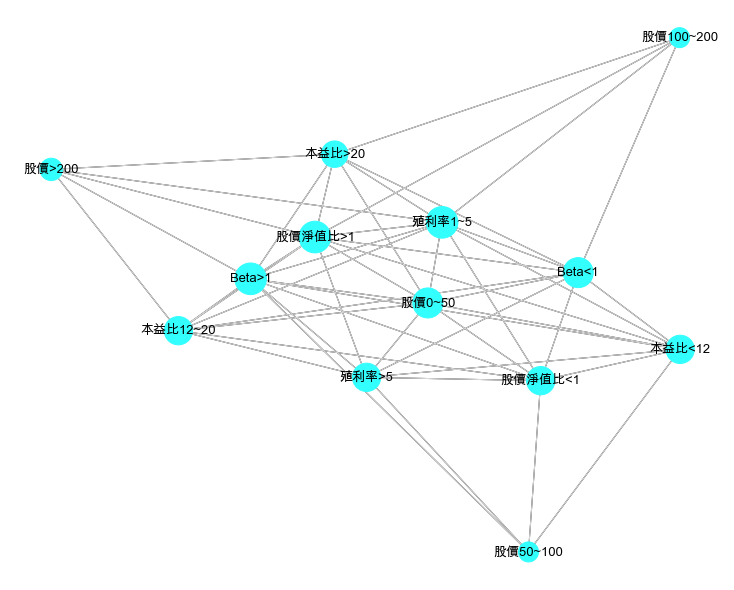

In [372]:
plt.figure(figsize=(10,8))
plt.rcParams['font.sans-serif'] = ['Arial Unicode MS']
pos=nx.spring_layout(A)
nx.draw(A,pos,node_size=[val*100 for (node, val) in A.degree()],node_color='#33FFFF')
nx.draw_networkx_labels(A, pos, font_size = 13,alpha=1)
nx.draw_networkx_edges(A, pos, edge_color='#DDDDDD', alpha=1)
# plt.savefig('0416_2330_Co_map.png')
plt.show()

由上圖可知瀏覽2330台積電的這群用戶可能會瀏覽的股票之特徵為：(只標共現次數其實都很相近，同指標取其高且相近者)

   * 股價位於0~50
   * 殖利率1~5
   * 股價淨值比>1
   * 本益比12~20
   * Beta係數>1

## 回去找出這群使用者 👫

In [394]:
list_2330 = [] #瀏覽2330還會看股票清單
for i in list2330:
    list_2330.append(i[1])

In [404]:
sym_list[0]

array(['6176', '1781', '2882', '2912', 'AAPL', '2887', '5302', '2458',
       '5468', '6129', '3268', '2412', '5351', '5314', '000980', '00672L',
       '1225', '00642U', '4904', '3034', '3317', '9103', '2303', '2731',
       '1714', '1731', '1799', '3037', '3189', '4108', '4128', '3481',
       '3149', '8927', '9931', '2317'], dtype=object)

In [447]:
user_2330 = []

for i in sym_list:
    count=0
    if '2330' in i:
        for j in i:
            if j in list_2330:
                count += 1
        user_2330.append(count/len(i))

<br>

🔍 找出“使用者瀏覽股票清單”和“看2330台積電後可能會看的股票清單”相似程度高達**8成**的使用者

In [448]:
user_id = []
idx = 0
for i in user_2330:
    if i >=0.8:
        user_id.append(idx)
    idx +=1

In [455]:
user_8_2330=[]
for i in user_id:
    user_8_2330.append([i,user_2330[i],str(sym_list[i])])

In [461]:
user_8_2330 = sorted(user_8_2330,key=lambda s:s[1],reverse=True)
user2330 = pd.DataFrame(user_8_2330,columns=['使用者ID','符合率','瀏覽清單'])

In [464]:
user2330

,使用者ID,符合率,瀏覽清單
0,833,0.857143,['2633' '3443' '00730' '00731' '2303' '0056' '...
1,77,0.833333,['2610' 'TWSE_SEM_INDEX_1' 'TPEX_OTC_INDEX_1' ...
2,803,0.818182,['2456' '4935' '3227' '4736' '3324' '8155' '64...
3,221,0.800000,['2337' '6176' '3227' 'TWSE_SEM_INDEX_1' '2330...
4,385,0.800000,['2884' '2330' '2618' '2882' '6214' '2886' '24...
5,1233,0.800000,['2363' '2002' '3376' '4540']


📍找出這些相似的使用者，就能夠更準確地進行推播。<br>

🚗我們可以將相似高達8成的使用者也觀看或追蹤的股票推薦給其他相似的使用者。（使用者分類）

<br>
